In [239]:
import pandas as pd

In [340]:
df = pd.read_csv("abalone.data", header=None) # у нас в даних немає заголовків, тож щоб 1 рядок не підтягнувся як назви колонок ставимо header = None
col_names = ["Sex", "Length", "Diameter", "Height", "Whole weight", "Shucked weight", "Viscera weight", "Shell weight", "Rings"]
df.columns = col_names

df.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [241]:
df.info()
# бачимо, що у нас відсутні пропуски даних, також ми можемо змінити типи даних для того, щоб наш датафрейм займав менше місця
df["Rings"] = df["Rings"].astype("Int16")

for col in df.select_dtypes(include="float"):
    df[col] = df[col].astype("float32")

df.info()
df.head() # запевнились що після зміни типів у нас не модифікувались дані (значення в діапазоні встановленого типу даних).
# можна було б і через describe подивитись мінімальне та максимальне значення кожної фічі, але для цього потрібно щє почититати про діапазони значенб типів даних

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sex             4177 non-null   object 
 1   Length          4177 non-null   float64
 2   Diameter        4177 non-null   float64
 3   Height          4177 non-null   float64
 4   Whole weight    4177 non-null   float64
 5   Shucked weight  4177 non-null   float64
 6   Viscera weight  4177 non-null   float64
 7   Shell weight    4177 non-null   float64
 8   Rings           4177 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 293.8+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sex             4177 non-null   object 
 1   Length          4177 non-null   float32
 2   Diameter        4177 non-null   float32
 3  

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [342]:
# перетворимо категорівальні фічі (у нас вона одна - Sex) у цифрові
from category_encoders.leave_one_out import LeaveOneOutEncoder  # мені сподобались варіанти енкодерів які видають 1 колонку з математично обгрунтованим числовим значенням 
                                                                #у такому випадку ми замість декількох фіч отримаємо одну, що робить модель простішою. 
                                                                # з іншого боку ми отримаємо і більшу кореляцію, але саме для цього і використовується метрична модель

encoder = LeaveOneOutEncoder()
df["Sex"] = encoder.fit_transform(df[["Sex"]], df["Rings"]).astype("float32")
df_orig = df.copy()
df.head()


,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,10.702685,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,10.707924,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,11.130934,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,10.705959,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,7.891126,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


<Axes: xlabel='Rings'>

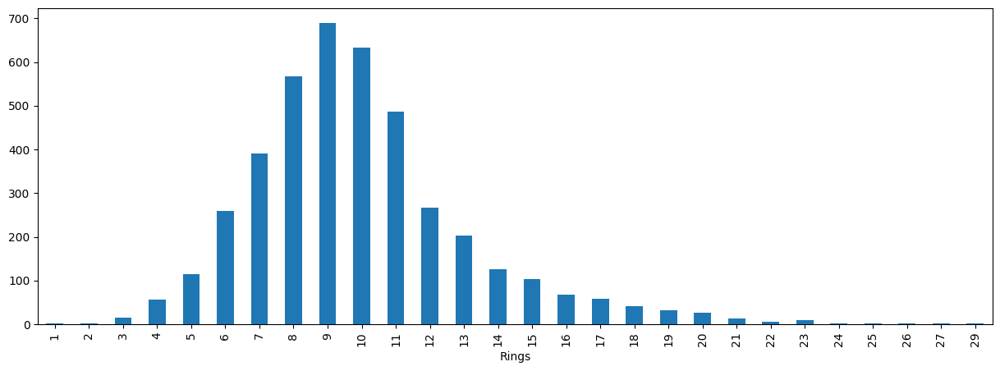

In [243]:
# подивимось наскільки у нас збалансований датасет по таргетам
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))
df["Rings"].value_counts().sort_index().plot(kind="bar")

# бачимо що у нас дуже не збалансований датасет за представленням таргетів, тож спробуємо додати штучних даних
# штучні дані варто додавати ДО нормалізації даних у датасеті та ПІСЛЯ переведення категоріальних фічей у цифрові

In [244]:
# перед створенням синтетичних даних нам варто дослідити датасет з метою розуміння, чи не варто нам спочатку викинути з нього аномальні дані,
# наявність яких може вплинути на створення штучних даних чим внесе більше шуму

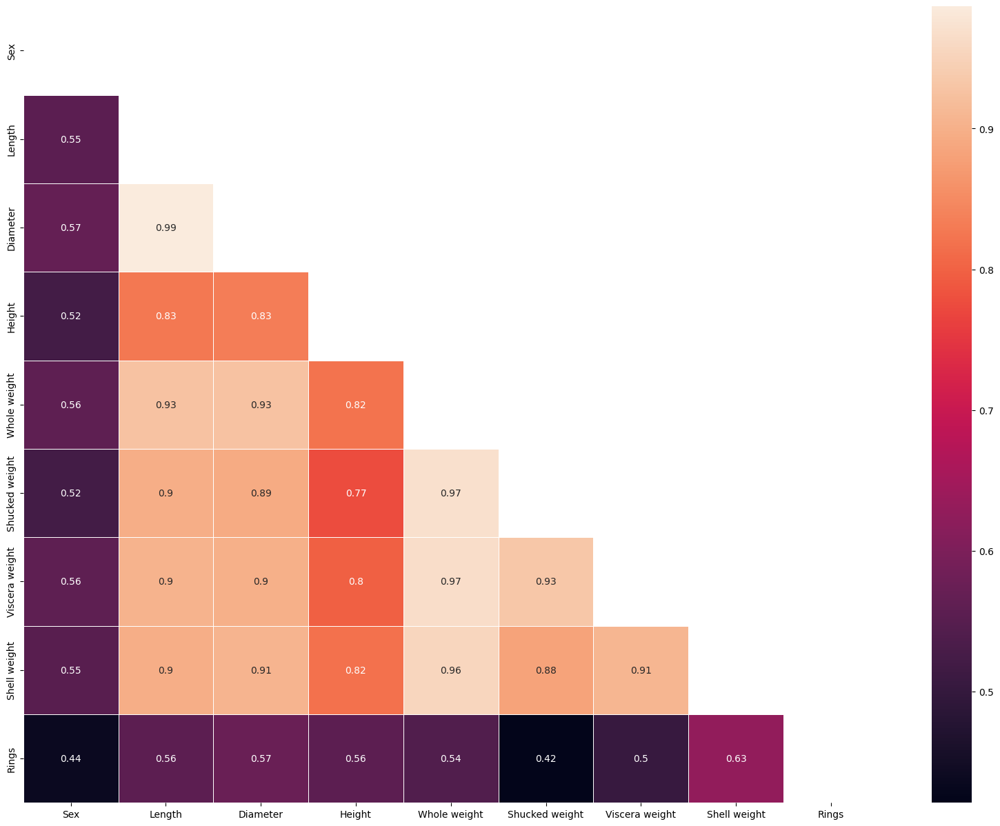

In [245]:
# подивимось на кореляцію ознак. Особливо нас цікавить зараз кореляція ознак з таргетом
import numpy as np
import seaborn as sns

def build_coe_matrix(df: pd.DataFrame) -> None:
    corr_matrix = df.corr()
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    plt.figure(figsize=(20, 15))
    sns.heatmap(corr_matrix, mask=mask, annot=True, linewidths=0.5)

build_coe_matrix(df)

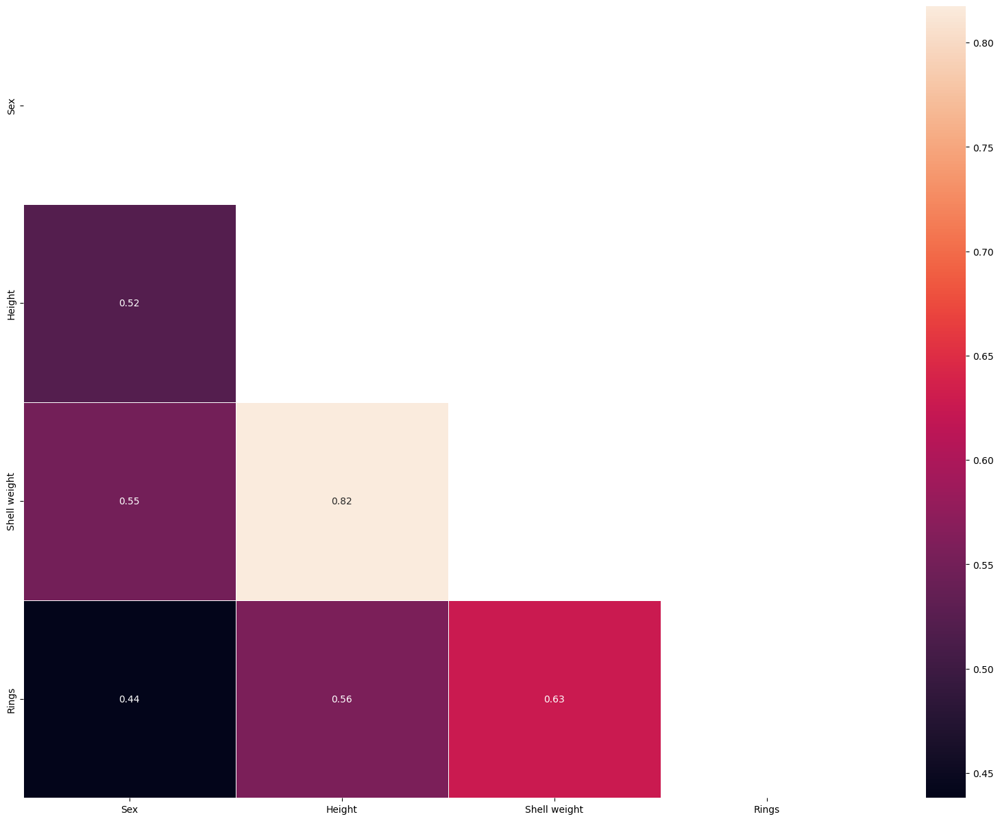

In [246]:
# ми бачимо що наші ознаки мають досить велику кореляцію між собою. І впринципі нормальну кореляцію з таргетом.
# Видалимо такі фічі як Length (кореляція > .9 з усіма фічами), whole_weight, shucked wight, viscera weight (мають надвисоку кореляцію із shell weight, але
# меншу ніж вона кореляцію із таргетом)
# також видалемо Diameter так як він потужно корелює з масою ракушки, але менше ніж вона корелює з таргетом

df_lite = df.drop(columns=["Length", "Whole weight", "Shucked weight", "Viscera weight", "Diameter"])
build_coe_matrix(df_lite)


In [247]:
# по-хорошему нам би щє видалити Height,  але я боюсь, що нам може не вистачити ознак для роботи моделі, тож поки залишимо
# тим паче враховуючи щро ми збираємось використовувати метричну модель - сильна кореляція це скоріше наш плюс

In [248]:
def repr_df_by_tsne(df: pd.DataFrame, tsne_repr, show_labels=False, rows=3,figsize=(12, 5)):
    _, axes = plt.subplots(rows, round(len(df.columns) / rows), sharey=True, figsize=figsize)
    axes = axes.flatten()

    for i, col in enumerate(df.columns):
        print(f"Будуємо репрезентацію дл {col}")
        ax = axes[i]
        target = df[col]

        # Отримання унікальних значень та кольорів для кожного з них
        target_unique = np.sort(target.unique())
        colors = plt.cm.rainbow(np.linspace(0, 1, len(target_unique)))

        # Малювання кожного унікального значення окремо з власним кольором
        for val, color in zip(target_unique, colors):
            mask = target == val
            ax.scatter(tsne_repr[mask, 0], tsne_repr[mask, 1], alpha=0.5, label=val if show_labels else None, color=color)

        # Налаштування заголовків та легенди
        ax.set_title(f't-SNE за {col}')
        if show_labels:
            ax.legend(title=col)

    # Налаштування зовнішнього вигляду графіку
    plt.tight_layout()
    plt.show()

In [249]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE

scaler = MinMaxScaler()
df_lite_scalled = scaler.fit_transform(df_lite)

tsne = TSNE(random_state=42)
tsne_repr = tsne.fit_transform(df_lite_scalled)

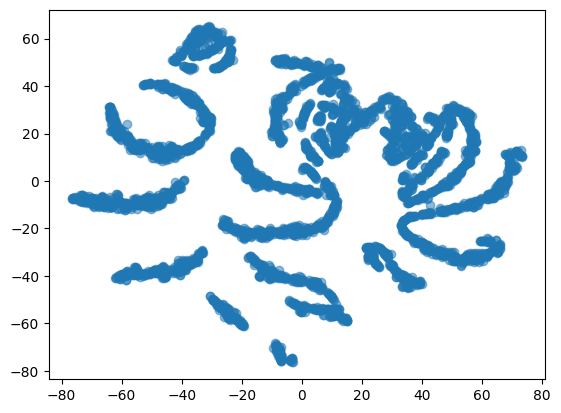

In [250]:
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5)
# бачимо дуже ярко виражені групи даних. 

In [251]:
# подивимось на репрезентацію нашого датасету до видалення фіч з високою кореляцією

df_scalled = scaler.fit_transform(df)

tsne_repr = tsne.fit_transform(df_scalled)

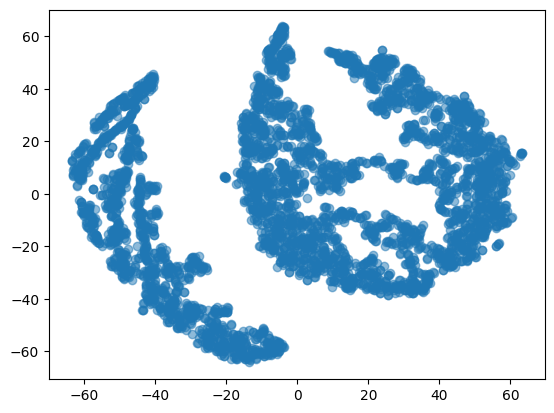

In [252]:
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5)

In [253]:
# Бачимо що репрезентації дуже сильно відрізняються: 
# на датасеті з усіма фічами ми маємо 2 ярковиражені групи, а на легкому датасеті - 12-14 груп. 
# можливо видалення фічей дозволило нам знайти саме ті ознаки які дозволять легко навчити модель та підвищіти її точність. 
# Для того щоб запевнитись, або довести зворотнє - отпрацюємо обидва датасети

Повний датасет з усіма ознаками

In [254]:
df_features = df.drop(columns=["Rings"])
features_scaled = scaler.fit_transform(df_features)
df_features_scaled = pd.DataFrame(features_scaled, columns=df_features.columns)
df_scaled = pd.concat([df_features_scaled, df["Rings"]], axis=1)

df_scaled

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,0.867424,0.513514,0.521008,0.084071,0.181335,0.150303,0.132324,0.147982,15
1,0.869034,0.371622,0.352941,0.079646,0.079157,0.066241,0.063199,0.068261,7
2,0.999058,0.614865,0.613445,0.119469,0.239065,0.171822,0.185648,0.207773,9
3,0.868430,0.493243,0.521008,0.110619,0.182044,0.144250,0.149440,0.152965,10
4,0.003209,0.344595,0.336134,0.070796,0.071897,0.059516,0.051350,0.053313,7
...,...,...,...,...,...,...,...,...,...
4172,0.998588,0.662162,0.663866,0.146018,0.313441,0.248151,0.314022,0.246637,11
4173,0.868430,0.695946,0.647059,0.119469,0.341420,0.294553,0.281764,0.258097,10
4174,0.868631,0.709459,0.705882,0.181416,0.415796,0.352724,0.377880,0.305431,9
4175,0.998823,0.743243,0.722689,0.132743,0.386931,0.356422,0.342989,0.293473,10


Будуємо репрезентацію дл Sex
Будуємо репрезентацію дл Length
Будуємо репрезентацію дл Diameter
Будуємо репрезентацію дл Height
Будуємо репрезентацію дл Whole weight
Будуємо репрезентацію дл Shucked weight
Будуємо репрезентацію дл Viscera weight
Будуємо репрезентацію дл Shell weight
Будуємо репрезентацію дл Rings


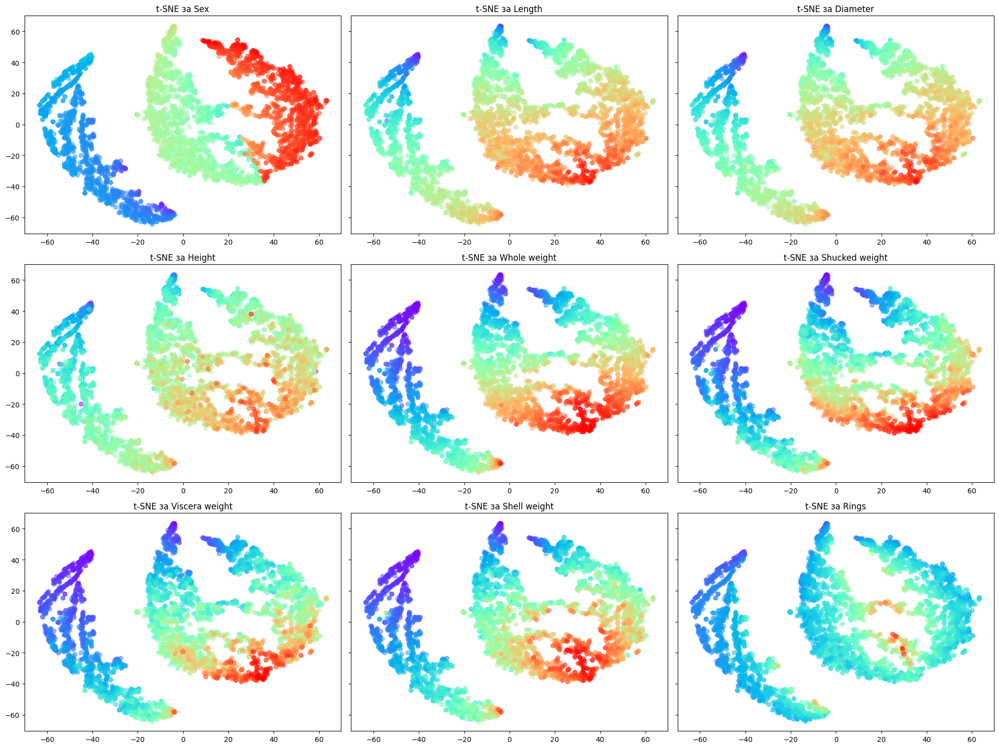

In [255]:
repr_df_by_tsne(df=df, tsne_repr=tsne_repr, show_labels=False, rows=3, figsize=(20, 15))

In [256]:

# бачимо підтвердження високої кореляції між фічами. Також наші глобальні дві групи - це пол:
#  ліворуч - I, праворуч група розділена на дві підгрупи які чітко розділені на M та W\

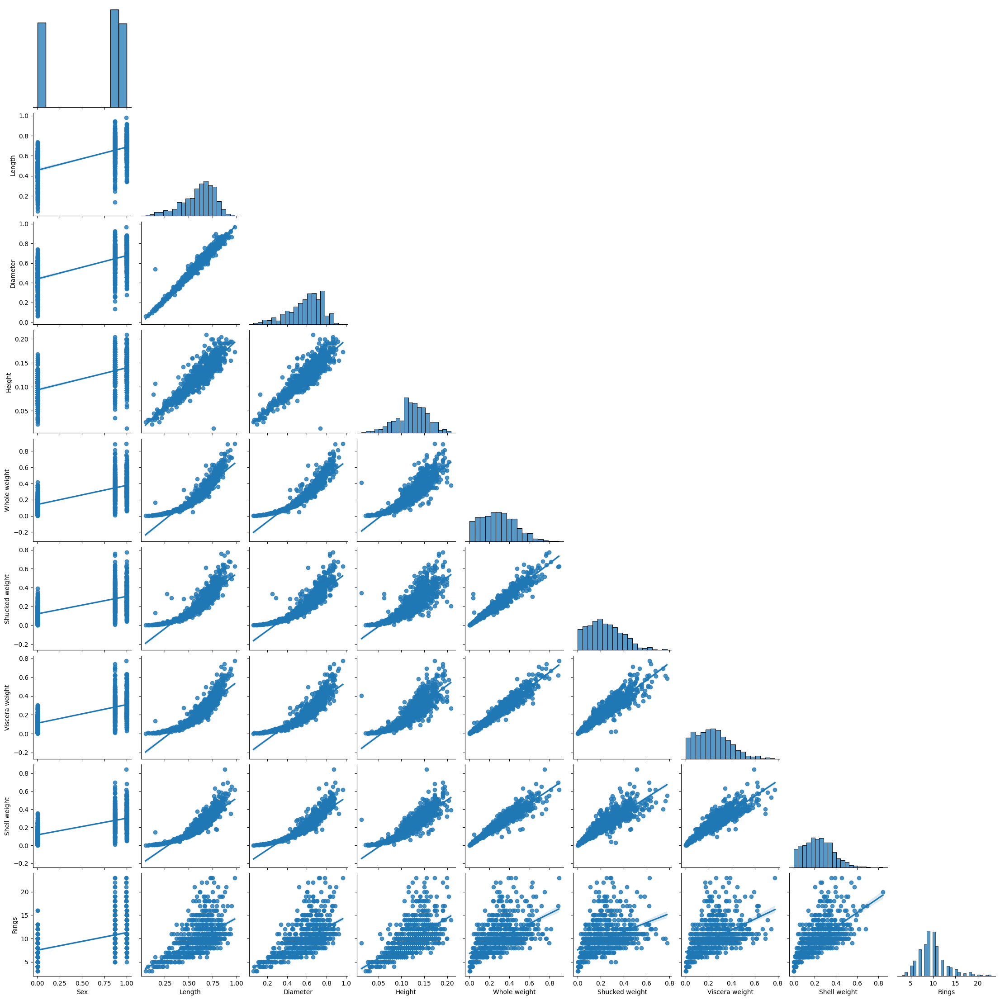

In [257]:
# подивимось на викиди і взагалі на консистентність даних
sns.pairplot(df_scaled.sample(frac=0.2, random_state=42), corner=True, kind='reg', diag_kind='hist')

# тут ми бачимо подеякі викиди і саме головне майже лінійну залежність всього від всього. 
# чесно кажучі вже на цьому етапі я хочу повернутись до роботи з датафреймом де видалені корелюючі фічі

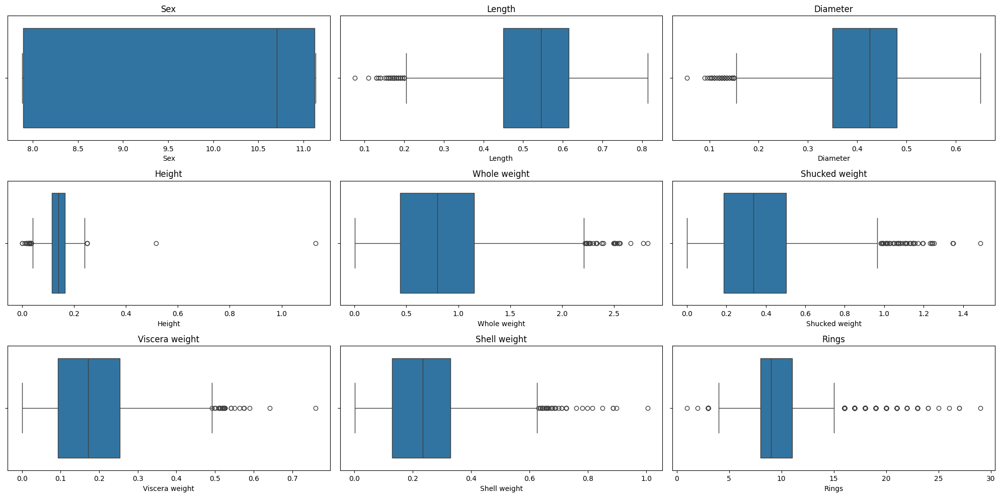

In [258]:
# докладніше дослідимо викиди
# Визначаємо кількість підграфіків
def get_boxplots(df, cols=3):
    vals_count = len(df.columns)
    rows = round(vals_count / cols) if not vals_count % cols else  (vals_count // cols) + 1
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))  
    axes = axes.flatten() # витягнемо в одномірний масив, щоб було простіше ітеруватись

    # Будуємо графіки у циклі, додаючи кожен на окремий підграфік
    for i, col in enumerate(df.columns):
        sns.boxplot(x=df[col], ax=axes[i]) # малюємо графік
        axes[i].set_title(col)

    plt.tight_layout() # щоб текст не наїжджав 
    
get_boxplots(df)

In [259]:
# поки що завфіксуємо картину по боксплотам такою як вона є. 
# Враховуючи те що у нас задача навчити метричну модель (висока кореляція - наш друг) та враховуючи дуже сильну несбалансованість датасета
# допускаю що створення штучних даних для найменш представлених категорій внесе більше шуму ніж користі
# тож спробуємо видалити класи які представлені у нас в дуже малій кількості, а саму задачу переведемо в площину регресії, а не класифікації
df["Rings"].value_counts().sort_index()


Rings
1       1
2       1
3      15
4      57
5     115
6     259
7     391
8     568
9     689
10    634
11    487
12    267
13    203
14    126
15    103
16     67
17     58
18     42
19     32
20     26
21     14
22      6
23      9
24      2
25      1
26      1
27      2
29      1
Name: count, dtype: Int64

In [260]:
df_test = df[(df["Rings"] <= 3) | (df["Rings"] >= 16)]
df_test
# використаємо ці дані для тестування. До тогож на 4000 строк даних витратити 111 рядків і тим самим отримати більше стабільності - цілком припустимо, я вважаю.
# UPD: вирішив перекинути всі викиди таргетів у тестову вибірку. Це лише приблизно 7-8 відсотків датасету, але при цьому нам потрібно буде створювати менше штучних даних



,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
6,11.122512,0.530,0.415,0.150,0.7775,0.2370,0.1415,0.330,20
7,11.125574,0.545,0.425,0.125,0.7680,0.2940,0.1495,0.260,16
9,11.123277,0.550,0.440,0.150,0.8945,0.3145,0.1510,0.320,19
32,10.700721,0.665,0.525,0.165,1.3380,0.5515,0.3575,0.350,18
33,11.123277,0.680,0.550,0.175,1.7980,0.8150,0.3925,0.455,19
...,...,...,...,...,...,...,...,...,...
3929,11.125574,0.650,0.515,0.215,1.4980,0.5640,0.3230,0.425,16
3930,11.121746,0.670,0.535,0.185,1.5970,0.6275,0.3500,0.470,21
3931,7.883669,0.550,0.440,0.165,0.8605,0.3120,0.1690,0.300,17
3944,10.699410,0.550,0.440,0.160,0.9910,0.3480,0.1680,0.375,20


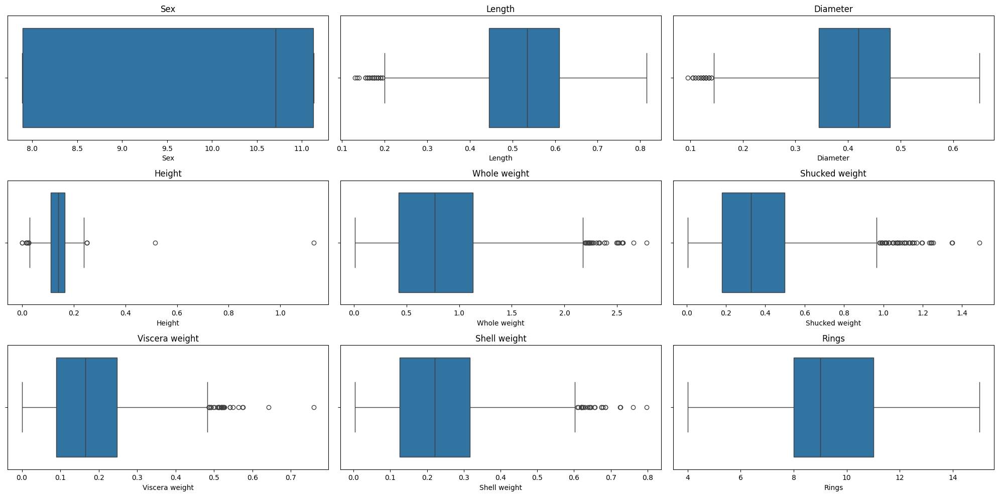

In [261]:
df_filtered = df[~df.isin(df_test).all(axis=1)] # виключили дані df_test із df

get_boxplots(df_filtered)

In [262]:
import statsmodels.api as sm

df_filtered_features, df_filtered_target = df_filtered.drop(columns=["Rings"]), df_filtered["Rings"]

df_filtered_fetures_scaled = sm.add_constant(scaler.fit_transform(df_filtered_features))

In [263]:
from sklearn.model_selection import train_test_split


X_train, X_val, y_train, y_val = train_test_split(df_filtered_fetures_scaled, df_filtered_target, test_size=0.15, random_state=42, stratify=df_filtered_target)



In [264]:
from imblearn.over_sampling import SMOTE
# додаємо синтетичні дані
resempler = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = resempler.fit_resample(X_train, y_train)



<Axes: xlabel='Rings', ylabel='count'>

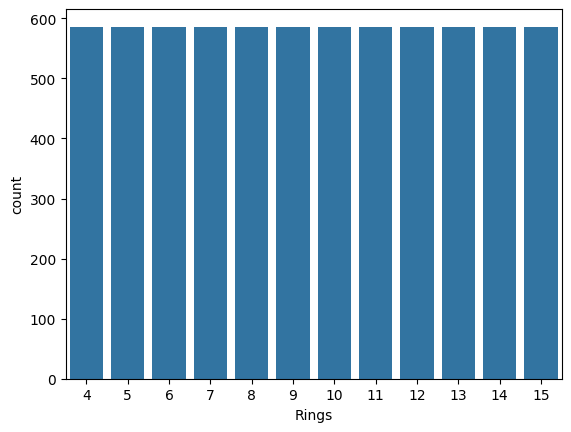

In [265]:
sns.countplot(x=y_train_resampled)


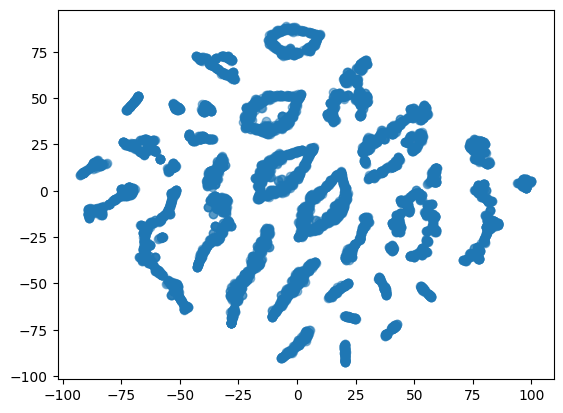

In [266]:
combined_data = np.column_stack((X_train_resampled, y_train_resampled))
tsne_repr = tsne.fit_transform(combined_data)
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5)
# цікавенько...



Будуємо репрезентацію дл Sex
Будуємо репрезентацію дл Length
Будуємо репрезентацію дл Diameter
Будуємо репрезентацію дл Height
Будуємо репрезентацію дл Whole weight
Будуємо репрезентацію дл Shucked weight
Будуємо репрезентацію дл Viscera weight
Будуємо репрезентацію дл Shell weight
Будуємо репрезентацію дл Rings


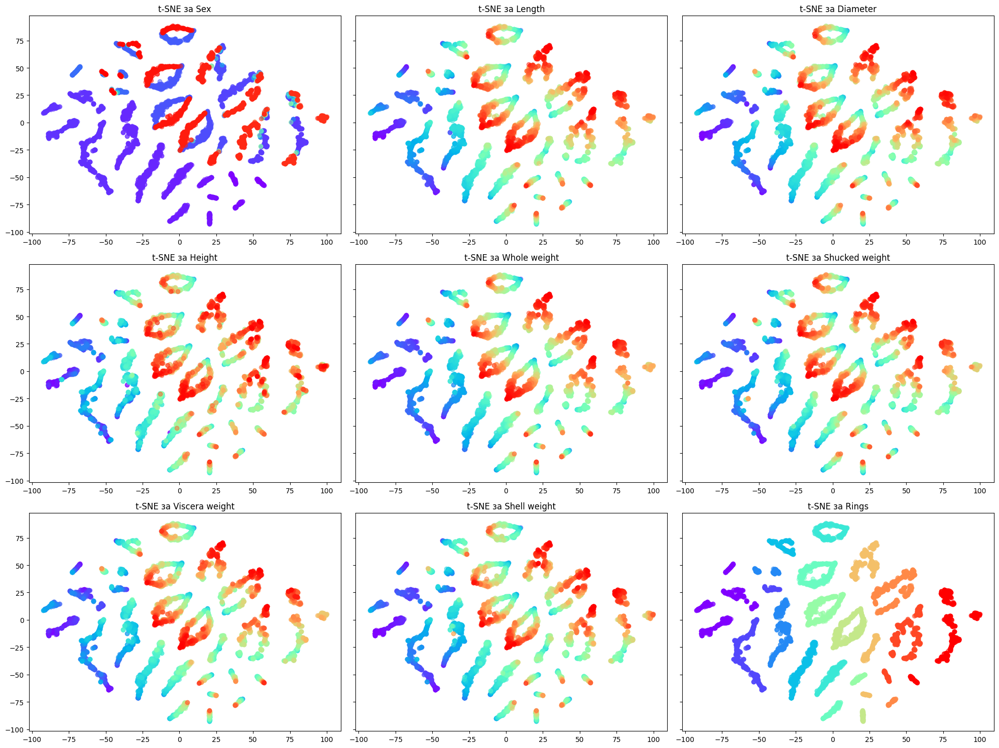

In [267]:
# так як функція працює з pd.Dataframe - корвертнемо в датафрейм
combined_df = pd.DataFrame(combined_data)

combined_df.columns = ["const"] + list(df.columns)
combined_df.drop(columns=["const"], inplace=True)

tsne_repr = tsne.fit_transform(combined_df)
repr_df_by_tsne(df=combined_df, tsne_repr=tsne_repr, show_labels=False, rows=3, figsize=(20, 15))

In [268]:
# бачимо що самі взаємозв'язки у нас зберіглись, але дані після додавання синтетичних стали більш розподіленими на окремі класи


In [269]:
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=5)
# Крос-валідація
cv_scores = cross_val_score(knn, X_train_resampled, y_train_resampled, cv=4, scoring='r2')

print("Результати крос-валідації:", cv_scores)
print("Середнє значення R^2:", cv_scores.mean())

# бачимо що за результатами крос-валідації ми маємо досить нестабільну, навіть непрацюючу модель з синтетичними даними

Результати крос-валідації: [ 0.3841372   0.62954619  0.67584602 -4.5700329 ]
Середнє значення R^2: -0.7201258725701821


In [270]:
# перевіримо як взагалі без синтетичних даних
cv_scores = cross_val_score(knn, X_train, y_train, cv=4, scoring='r2')

print("Результати крос-валідації:", cv_scores)
print("Середнє значення R^2:", cv_scores.mean())
# а тут маємо стабільну модель

Результати крос-валідації: [0.48444731 0.52044483 0.48271128 0.50637539]
Середнє значення R^2: 0.4984947013365985


In [271]:
# спробуємо інший алгоритм створення штучних даних
from imblearn.over_sampling import SVMSMOTE
# додаємо синтетичні дані
svm = SVMSMOTE(random_state=42)
X_train_svmsmote, y_train_svmsmote = svm.fit_resample(X_train, y_train)

In [272]:

cv_scores = cross_val_score(knn, X_train_svmsmote, y_train_svmsmote, cv=4, scoring='r2')

print("Результати крос-валідації:", cv_scores)
print("Середнє значення R^2:", cv_scores.mean())

# стало значно кращє і ми навіть тепер маємо r2 більше ніж у оригінальних даних, хоча результати крос-валідації показують певний дісбаланс

Результати крос-валідації: [0.43910702 0.47282919 0.75912959 0.60406807]
Середнє значення R^2: 0.5687834660487778


In [273]:
from imblearn.over_sampling import SMOTEN
sampler = SMOTEN(random_state=42)
X_train_smoten, y_train_smotem = sampler.fit_resample(X_train, y_train)

# перевіримо як взагалі без синтетичних даних
cv_scores = cross_val_score(knn, X_train_smoten, y_train_smotem, cv=4, scoring='r2')

print("Результати крос-валідації:", cv_scores)
print("Середнє значення R^2:", cv_scores.mean())

# маємо навіть гірший результат ніж в SMOTE

Результати крос-валідації: [ 0.37510048  0.6135809   0.41272241 -8.79542027]
Середнє значення R^2: -1.848504119473131


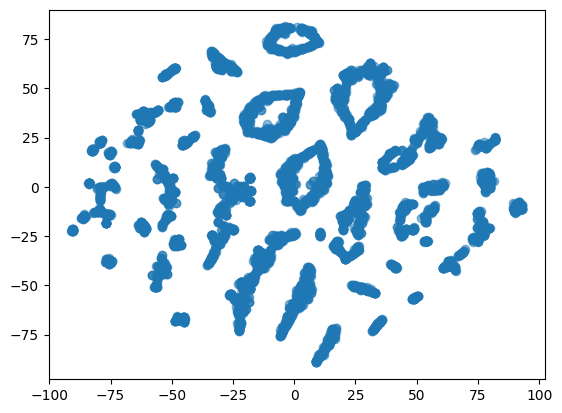

In [274]:
# цікаво як репрезентація виглядатиме тепер
combined_data = np.column_stack((X_train_svmsmote, y_train_svmsmote))
tsne_repr = tsne.fit_transform(combined_data)
plt.scatter(tsne_repr[:, 0], tsne_repr[:, 1], alpha=0.5)

# бачимо що отримали схожу, але більш впорядковану репрезентацію ніж після SMOTE. 

Будуємо репрезентацію дл Sex
Будуємо репрезентацію дл Length
Будуємо репрезентацію дл Diameter
Будуємо репрезентацію дл Height
Будуємо репрезентацію дл Whole weight
Будуємо репрезентацію дл Shucked weight
Будуємо репрезентацію дл Viscera weight
Будуємо репрезентацію дл Shell weight
Будуємо репрезентацію дл Rings


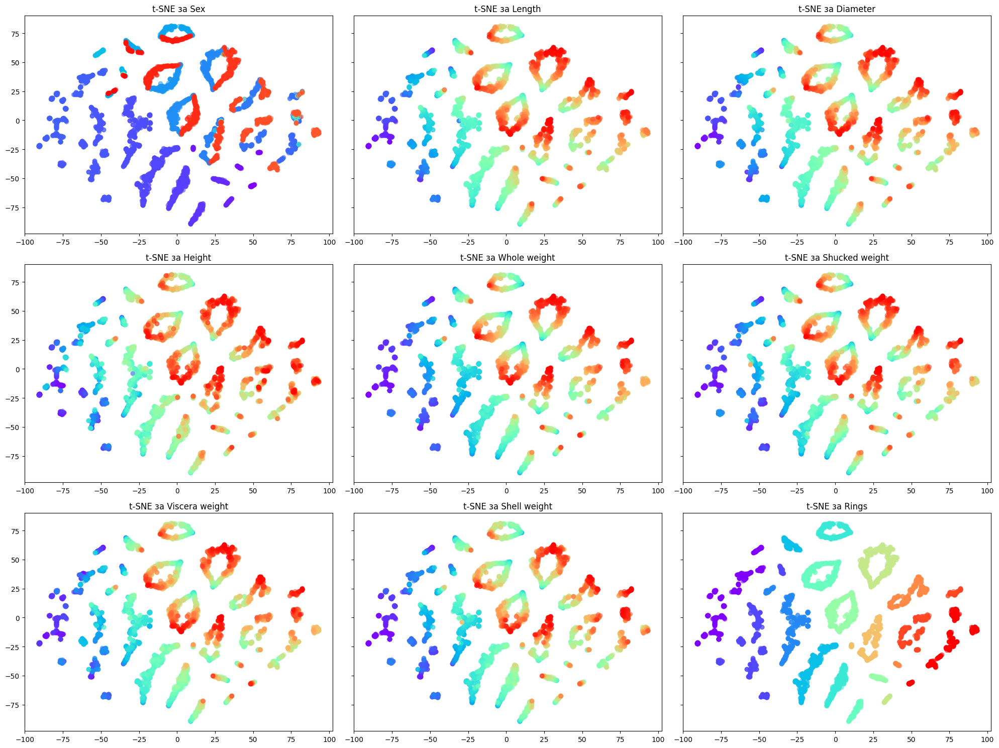

In [275]:
combined_df = pd.DataFrame(combined_data)

combined_df.columns = ["const"] + list(df.columns)
combined_df.drop(columns=["const"], inplace=True)

tsne_repr = tsne.fit_transform(combined_df)
repr_df_by_tsne(df=combined_df, tsne_repr=tsne_repr, show_labels=False, rows=3, figsize=(20, 15))

In [276]:
# перше що бачимо - дані по полу стали більш розподіленими на відміну від SMOTE
# взалалі розподіл кольорів став більш плавним. Тобто в нашому випадку SVMSMOTE спрацював таким чином, що додав різноманітності даним

In [277]:
from sklearn.metrics import f1_score, mean_squared_error, recall_score, accuracy_score, r2_score
from sklearn.model_selection import GridSearchCV
random_state = 42

# додамо логів
def get_scores(predicted, y, plot=True):
    r2 = r2_score(y_true=y, y_pred=predicted)
    mse = mean_squared_error(y_true=y, y_pred=predicted)
    accuracy = accuracy_score(y_true=y, y_pred=np.round(predicted))
    recall = recall_score(y_true=y, y_pred=np.round(predicted), average="micro") # так як наш датасет незбалансований
    f1 = f1_score(y_true=y, y_pred=np.round(predicted), average="micro")
    if plot:
        plot_results(y=y, predicted=predicted)
    return f"r2: {r2}\nmse: {mse}\naccuracy: {accuracy}\nrecall: {recall}\nf1: {f1}"

def plot_results(y, predicted):
    
    losses = y - predicted
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))

    # 1. Scatter Plot залишків
    axs[0, 0].scatter(predicted, losses, alpha=0.5)
    axs[0, 0].axhline(y=0, color='r', linestyle='--')
    axs[0, 0].set_xlabel('Передбачені значення')
    axs[0, 0].set_ylabel('Залишки')
    axs[0, 0].set_title('Scatter Plot залишків')

    # 2. Гістограма залишків
    sns.histplot(losses, kde=True, ax=axs[0, 1], bins=20, color='b', edgecolor='k')
    axs[0, 1].set_xlabel('Залишки')
    axs[0, 1].set_ylabel('Частота')
    axs[0, 1].set_title('Гістограма залишків')

    # 3. Передбачені значення vs Істинні значення
    axs[1, 0].scatter(y, predicted, alpha=0.5, color='g')
    axs[1, 0].plot([y.min(), y.max()], [y.min(), y.max()], color='r', linestyle='--')
    axs[1, 0].set_xlabel('Істинні значення')
    axs[1, 0].set_ylabel('Передбачені значення')
    axs[1, 0].set_title('Передбачені значення vs Істинні значення')

    # 4. Q-Q Plot залишків
    sm.qqplot(losses, line='s', ax=axs[1, 1])
    axs[1, 1].set_title('Q-Q графік залишків')

    # Налаштування та показ графіка
    plt.tight_layout()
    plt.show()

In [278]:
X_test, y_test = df_test.drop(columns="Rings"), df_test["Rings"]
X_test_scld = sm.add_constant(scaler.fit_transform(X_test))

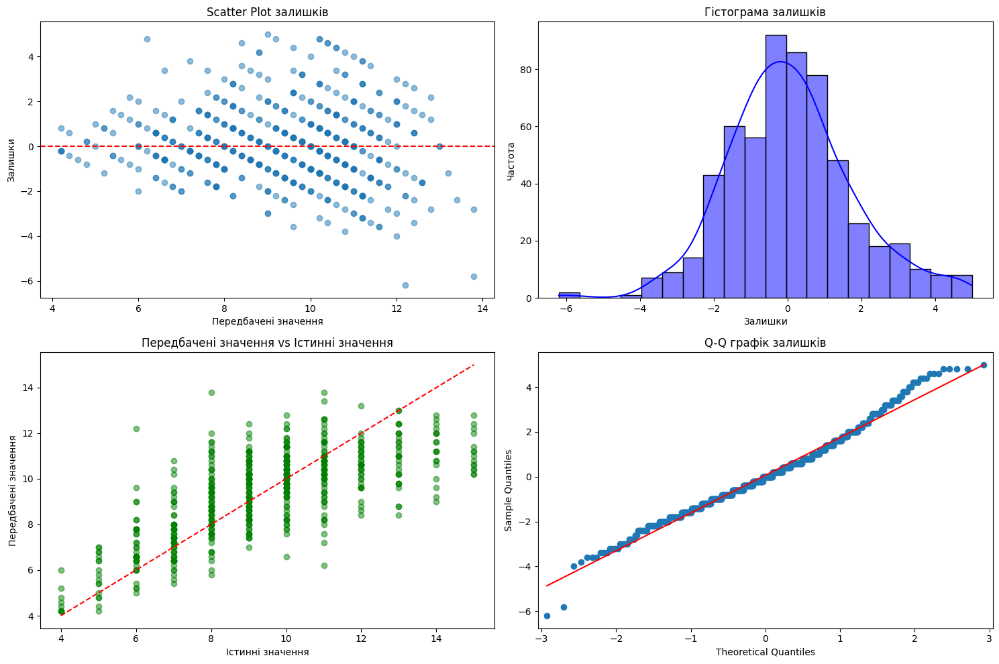

r2: 0.500544075671781
mse: 2.843897435897436
accuracy: 0.24786324786324787
recall: 0.24786324786324787
f1: 0.24786324786324787


In [279]:
# натренуємо та перевіремо модель на стандартних параметрах та на оригінальних не збалансованих даних
model_imbalanced = KNeighborsRegressor()
model_imbalanced.fit(X_train, y_train)
y_pred = model_imbalanced.predict(X_val)



print(get_scores(predicted=y_pred, y=y_val))

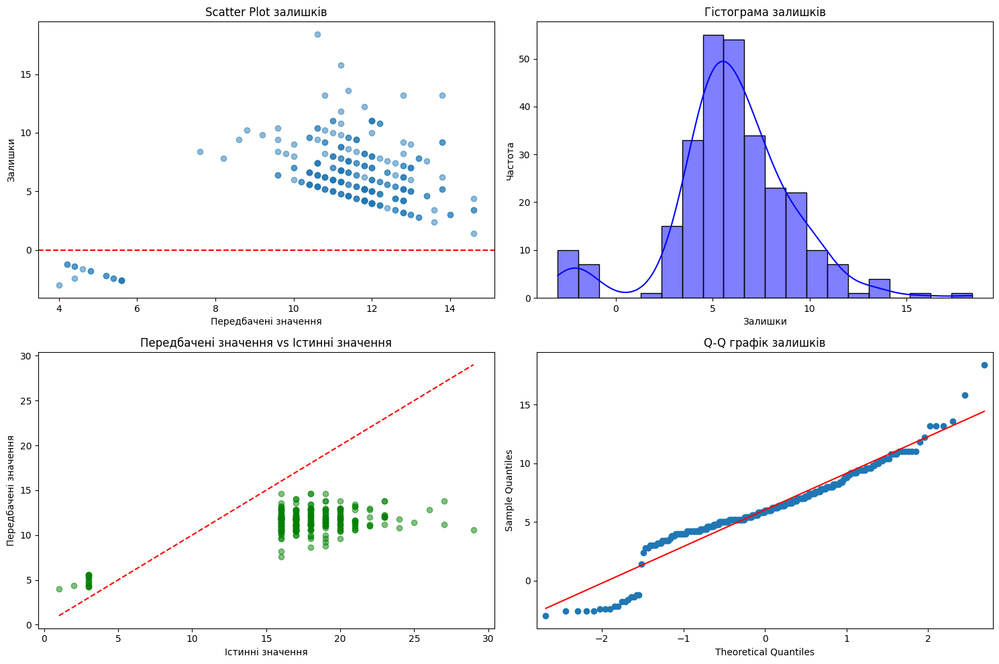

r2: -1.4813803547190618
mse: 46.00863309352518
accuracy: 0.0
recall: 0.0
f1: 0.0


In [280]:
# на тестовій вибірці
y_pred_test = model_imbalanced.predict(X_test_scld)

print(get_scores(predicted=y_pred_test, y=y_test))

In [281]:
# бачимо що модель показала себе досить слабо 24% точності на валідаційних даних і зовсім не спрацювала на тестових, яких раніше навіть і не бачила

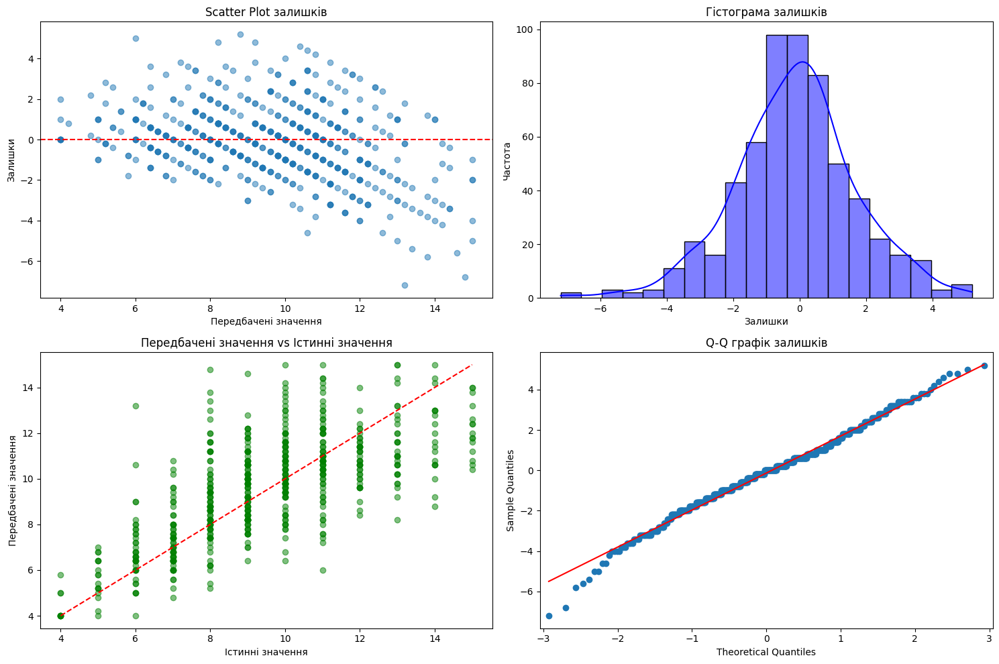

r2: 0.40692611101360665
mse: 3.3769572649572646
accuracy: 0.24615384615384617
recall: 0.24615384615384617
f1: 0.24615384615384617


In [282]:
# натренуємо та перевіремо модель на стандартних параметрах та на датафреймі зі штучними даними

model_imbalanced.fit(X_train_svmsmote, y_train_svmsmote)
y_pred = model_imbalanced.predict(X_val)

print(get_scores(predicted=y_pred, y=y_val))

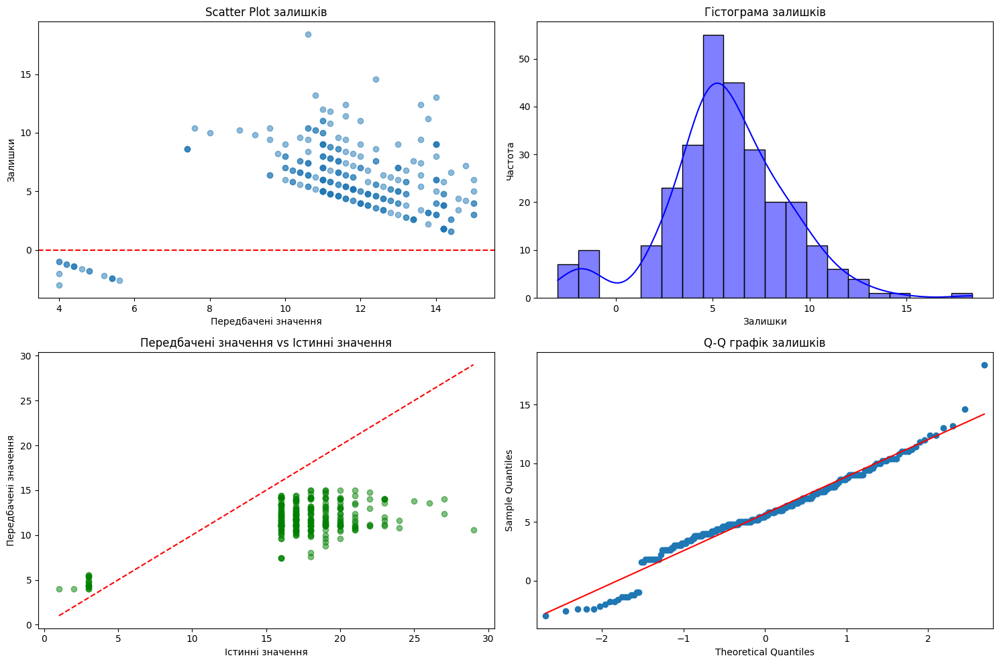

r2: -1.2884168699165723
mse: 42.43079136690648
accuracy: 0.0
recall: 0.0
f1: 0.0


In [283]:
y_pred_test = model_imbalanced.predict(X_test_scld)

print(get_scores(predicted=y_pred_test, y=y_test))

In [284]:
# зі штучними даними глобально ситуація такаж сама, але на валідаційній вибірці відхилення менше

In [285]:
# спробуємо покрутити гіперпараметри
from sklearn.model_selection import GridSearchCV
model = KNeighborsRegressor()
param_grid = {
    "n_neighbors": list(range(2, 31)),
    "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": list(range(2, 51)),
    "p": [1, 2]
}
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, n_jobs=-1, scoring='r2', verbose=1)

In [286]:
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 22736 candidates, totalling 90944 fits


GridSearchCV(cv=4, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                       14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                       24, 25, 26, 27, 28, 29, 30, 31, ...],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='r2', verbose=1)

Найкращі параметри:  {'algorithm': 'auto', 'leaf_size': 2, 'n_neighbors': 22, 'p': 1, 'weights': 'distance'}
Найкращий результат R^2:  0.5445127545653778


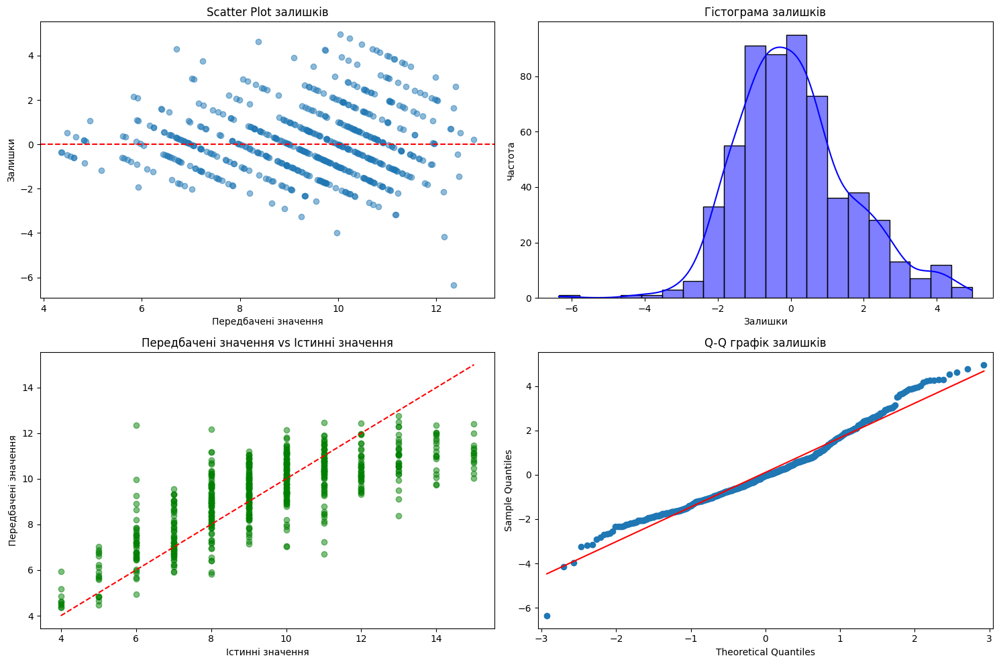

r2: 0.569959323283705
mse: 2.448647654925756
accuracy: 0.26153846153846155
recall: 0.26153846153846155
f1: 0.26153846153846155


In [287]:
# Найкращі параметри та оцінка моделі з використанням крос-валідації                                                                                                                                                                                                                                                                                                                                      ЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙЙ
print("Найкращі параметри: ", grid_search.best_params_)
print("Найкращий результат R^2: ", grid_search.best_score_)

# Використовуємо найкращу модель для передбачення
best_model = grid_search.best_estimator_   
# print("fetures: ", best_model.feature_names_in_) # працює, якщо подаємо датафрейм
y_pred = best_model.predict(X_val)
print(get_scores(predicted=y_pred, y=y_val))

In [288]:
def get_point_plot(p, y):

    # Перетворюємо на NumPy масиви
    y_np = np.array(y)
    y_pred_np = np.array(p)

    # Отримуємо індекси сортування 
    sorted_indices = np.argsort(y_np)

    # Сортуємо y_full_test і y_pred відповідно до індексів сортування
    y_sorted = y_np[sorted_indices]
    y_pred_sorted = y_pred_np[sorted_indices]
    plt.figure(figsize=(30, 10))

    # Лінія через передбачені точки
    plt.plot(y_pred_sorted, label='Передбачені значення', color='b', linestyle='-', marker='o')

    # Точки для фактичних значень 
    plt.scatter(range(len(y)), y_sorted, color='r', label='Фактичні значення', alpha=0.7)

    plt.xlabel('Індекс зразка')
    plt.ylabel('Значення')
    plt.title('Порівняння передбачених і фактичних значень')
    plt.legend()
    plt.grid(True)
    plt.show()

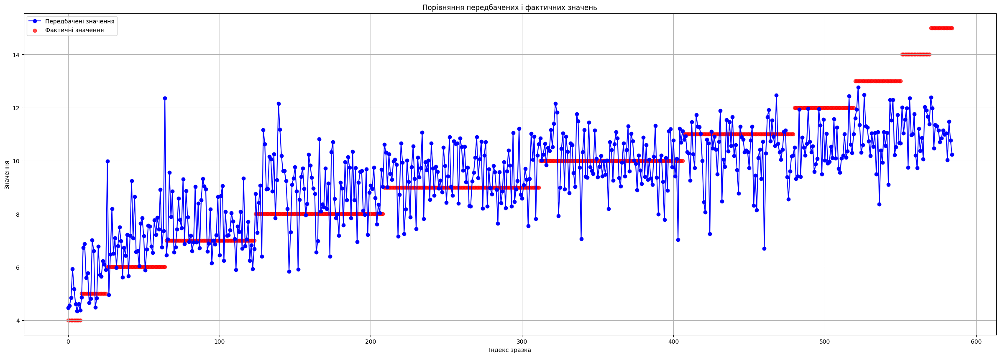

In [289]:
predicted_val = best_model.predict(X_val)

get_point_plot(predicted_val, y_val)



In [290]:
# бачимо, що наша модель щє +- непогано справляється з меншими значеннями, але у неї є серйозні проблеми з більшими 

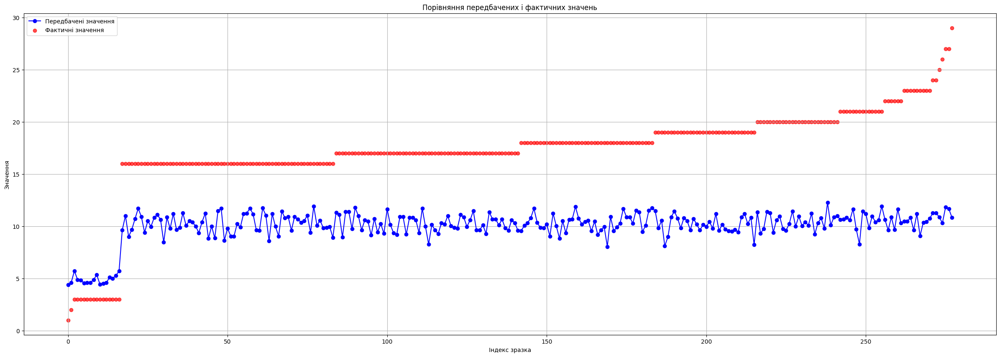

In [291]:
test_pred = best_model.predict(X_test_scld)
get_point_plot(test_pred, y_test)
# перевірка на тестових даних підтверджує що модель дуже погано розуміє дані, які вищі за максимум який був у виборці. Судячи з усього там не така проста залежність ніж я очікував

In [292]:
# повернемо всі дані та навчимо модель на них
sm.add_constant(df)

features, targets = scaler.fit_transform(df.drop(columns=["Rings"])), df["Rings"]

X_full_train, X_full_test, y_full_train, y_full_test= train_test_split(features, targets, test_size=0.15, random_state=42, stratify=None) 
# пробуємо без штучних даних тож stratify = None, так як є класи представлені в одному екземплярі


In [293]:
X_full_train

array([[0.99858785, 0.7972973 , 0.7731093 , ..., 0.37558842, 0.38512182,
        0.43447933],
       [0.9992938 , 0.6554054 , 0.6470589 , ..., 0.22528581, 0.2317314 ,
        0.24265073],
       [0.99882317, 0.6689189 , 0.6890757 , ..., 0.21082717, 0.33838052,
        0.26058796],
       ...,
       [0.8682287 , 0.5878378 , 0.57142866, ..., 0.16341628, 0.1751152 ,
        0.18584953],
       [0.86863136, 0.67567563, 0.6890757 , ..., 0.34633487, 0.28703097,
        0.23268561],
       [0.99976444, 0.7027027 , 0.70588243, ..., 0.36718225, 0.30348915,
        0.26856005]], dtype=float32)

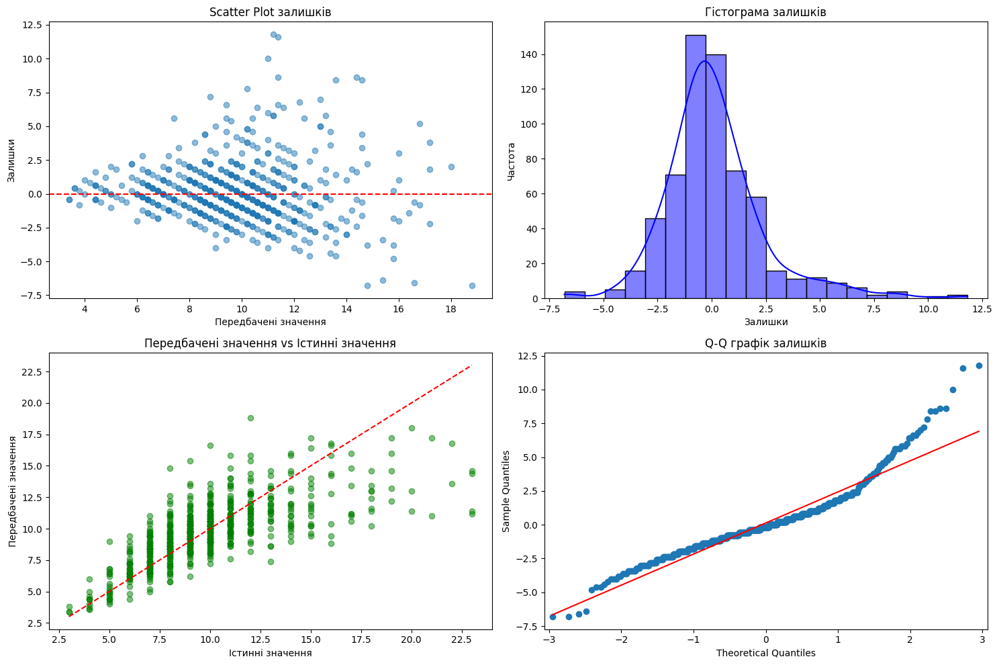

r2: 0.5170543082466637
mse: 5.302775119617225
accuracy: 0.24082934609250398
recall: 0.24082934609250398
f1: 0.24082934609250398


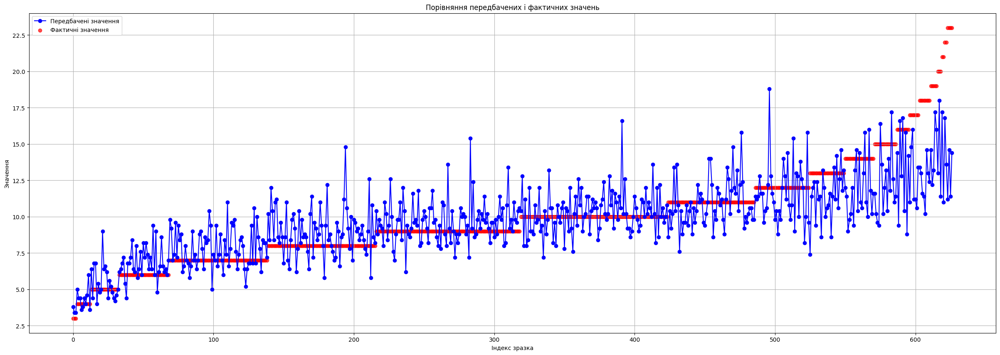

In [294]:
base_reg_model = KNeighborsRegressor()
base_reg_model.fit(X_full_train, y_full_train)

res = base_reg_model.predict(X_full_test)
print(get_scores(predicted=res, y=y_full_test))
get_point_plot(res, y_full_test)

In [296]:
# на повному датасеті ми бачимо значно кращу картину. Більші значення все щє мають більші відхилення. Спробуємо додати штучних даних через SVMSMOTE


In [325]:
df_no_ones = df[(df["Rings"] >= 3) & (df["Rings"] <= 23)]  # для створення штучних даних нам необхідно видалити приклади де їх дуже мало
# повернемо всі дані та навчимо модель на них
df_no_ones = sm.add_constant(df_no_ones)

features, targets = df_no_ones.drop(columns=["Rings"]), df_no_ones["Rings"]
resempler = SMOTE(random_state=42)
features_smote, targets_smote = resempler.fit_resample(features, targets)


In [298]:
features_smote = scaler.fit_transform(features_smote)

In [299]:
X_full_train, X_full_test, y_full_train, y_full_test= train_test_split(features_smote, targets_smote, test_size=0.15, random_state=42, stratify=targets_smote) 



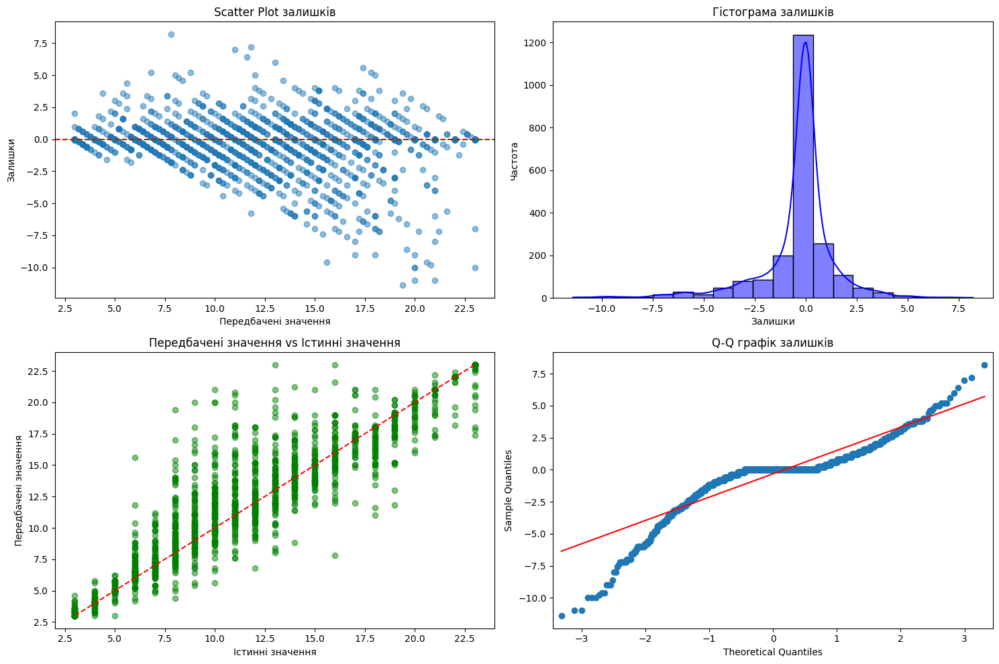

r2: 0.9065821369790593
mse: 3.4239705204974666
accuracy: 0.5647167204053432
recall: 0.5647167204053432
f1: 0.5647167204053432


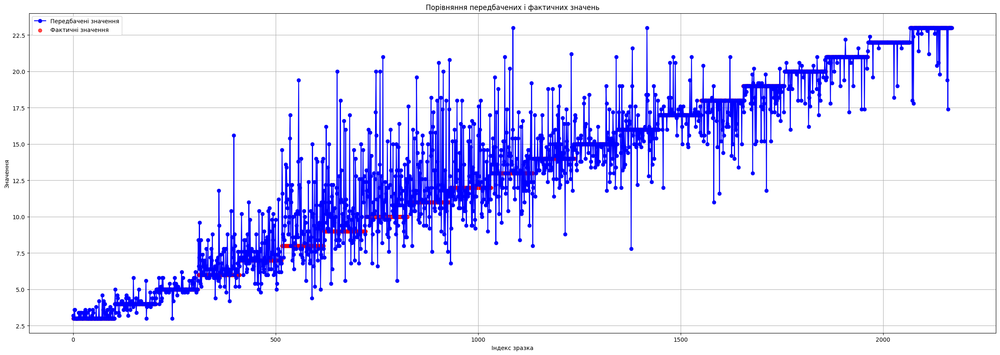

In [300]:
base_reg_model.fit(X_full_train, y_full_train)

res = base_reg_model.predict(X_full_test)
print(get_scores(predicted=res, y=y_full_test))
get_point_plot(res, y_full_test)

In [ ]:
# бачимо що на повному датасеті та зі штучними даними ми маємо 90% r2, але хотілося б перевірити це на валідації без штучних даних

In [301]:

features, targets = df_no_ones.drop(columns=["Rings"]), df_no_ones["Rings"]
X_full_train, X_full_test, y_full_train, y_full_test= train_test_split(features, targets, test_size=0.15, random_state=42, stratify=targets) 



In [302]:
resempler = SMOTE(k_neighbors=4, random_state=42)
X_full_train, y_full_train = resempler.fit_resample(X_full_train, y_full_train)

In [303]:
X_full_test = scaler.fit_transform(X_full_test)
X_full_train = scaler.fit_transform(X_full_train)

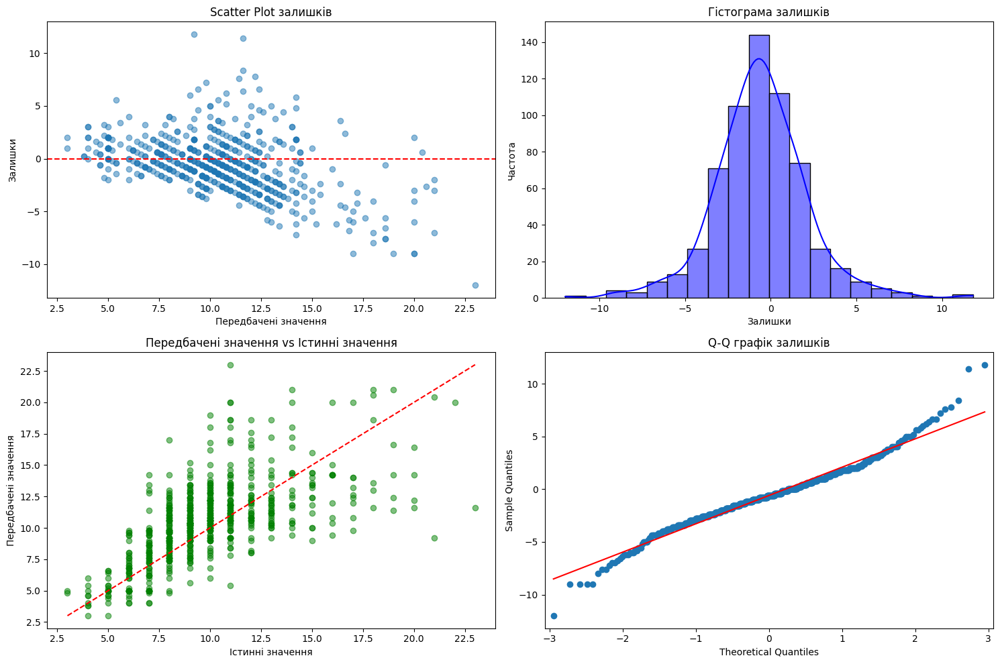

r2: 0.23337937869794934
mse: 7.563642172523962
accuracy: 0.16613418530351437
recall: 0.16613418530351437
f1: 0.16613418530351437


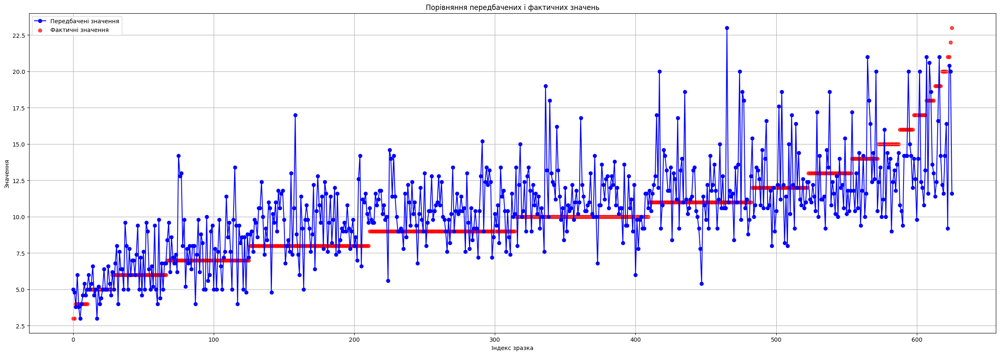

In [304]:
base_reg_model.fit(X_full_train, y_full_train)

res = base_reg_model.predict(X_full_test)  # тут тепер не містяться синтетичні дані
print(get_scores(predicted=res, y=y_full_test)) 
get_point_plot(res, y_full_test)

In [308]:
# бачимо що на реалььних даних модель показала себе значно гірше. Але набагото кращє ніє коли ми відкинули 7% датасету
# подивимось що буде якщо покрутити гіперпараметри
model = KNeighborsRegressor()
param_grid = {
    "n_neighbors": list(range(2, 31)),  
    "weights": ["uniform", "distance"], 
    "algorithm": ["auto", "kd_tree"], 
    "leaf_size": list(range(10, 41, 10)),
    "p": [1, 2]  
}
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=4, n_jobs=-1, scoring='r2', verbose=2)
grid_search.fit(X_full_train, y_full_train)

print("Найкращі параметри: ", grid_search.best_params_)
print("Найкращий результат R^2: ", grid_search.best_score_)

# Використовуємо найкращу модель для передбачення
best_model = grid_search.best_estimator_   
# print("fetures: ", best_model.feature_names_in_) # працює, якщо подаємо датафрейм


Fitting 4 folds for each of 928 candidates, totalling 3712 fits
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=distance; total time=   0.1s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=uniform; total time=   0.2s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=1, weights=uniform; total time=   0.2s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=2, weights=uniform; total time=   0.2s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=2, weights=uniform; total time=   0.1s
[CV] END algorithm=auto, leaf_size=10, n_neighbors=2, p=2, weights=distance; t

In [ ]:
# дивно, що таж модель обрала явно не найкращі параметри, судячи з того що при стандартних вона хоч якось працювала

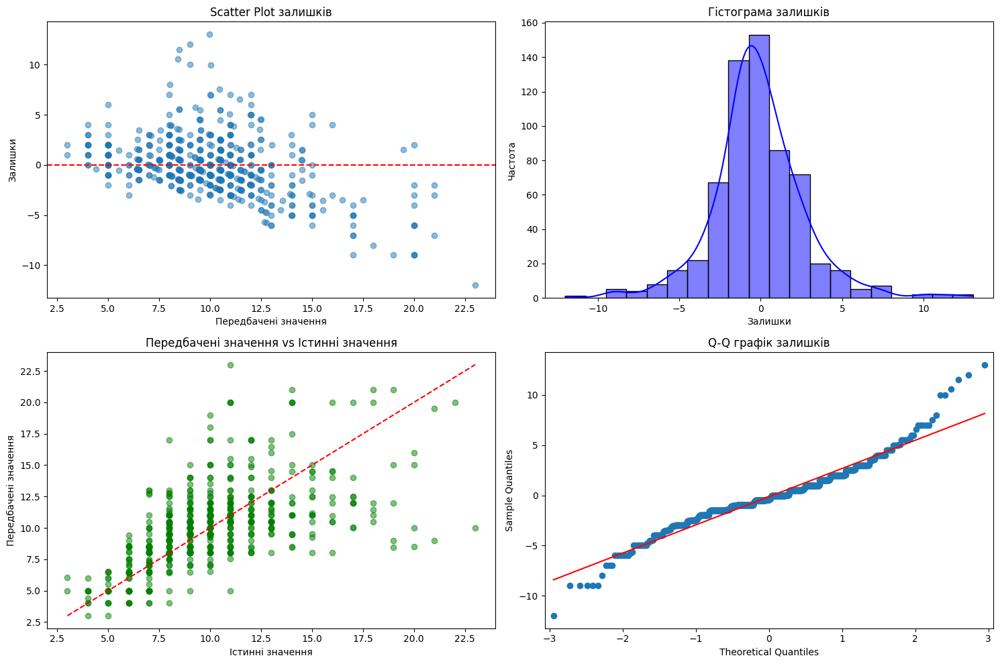

r2: 0.19752849372931403
mse: 7.917354632032973
accuracy: 0.1805111821086262
recall: 0.1805111821086262
f1: 0.1805111821086262


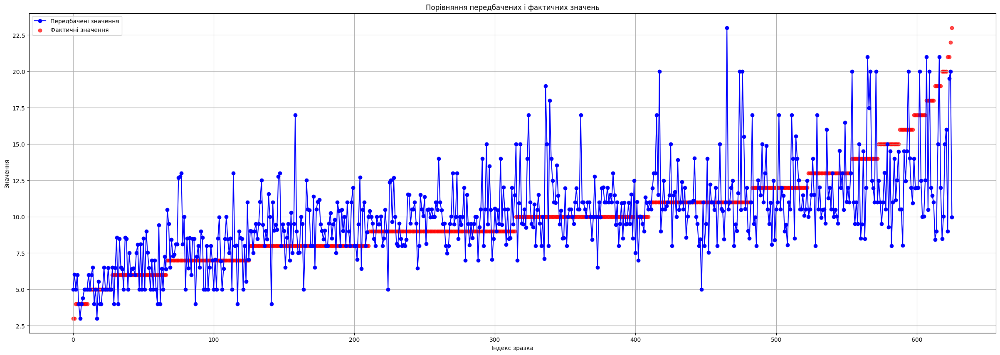

In [309]:
y_pred = best_model.predict(X_full_test)
print(get_scores(predicted=y_pred, y=y_full_test))


get_point_plot(y_pred, y_full_test)


Датасет з прибраними даними які мають високу кореляцію

In [331]:
rings_count = df_lite["Rings"].value_counts()
mask = rings_count[rings_count >= 2].index
df = df_lite[df_lite["Rings"].isin(mask)]

In [332]:
df

,Sex,Height,Shell weight,Rings
0,10.702685,0.095,0.1500,15
1,10.707924,0.090,0.0700,7
2,11.130934,0.135,0.2100,9
3,10.705959,0.125,0.1550,10
4,7.891126,0.080,0.0550,7
...,...,...,...,...
4172,11.129403,0.165,0.2490,11
4173,10.705959,0.135,0.2605,10
4174,10.706614,0.205,0.3080,9
4175,11.130169,0.150,0.2960,10


In [333]:
df_features, df_target = df.drop(columns=["Rings"]), df["Rings"]

In [334]:
features = scaler.fit_transform(df_features)

In [335]:
features

array([[0.8674238 , 0.08407079, 0.1467066 ],
       [0.86903405, 0.07964602, 0.06686626],
       [0.9990585 , 0.11946903, 0.20658682],
       ...,
       [0.86863136, 0.18141593, 0.30439124],
       [0.99882317, 0.13274337, 0.2924152 ],
       [0.8680277 , 0.17256637, 0.491018  ]], dtype=float32)

In [336]:
features = sm.add_constant(features)
features

array([[1.        , 0.86742377, 0.08407079, 0.1467066 ],
       [1.        , 0.86903405, 0.07964602, 0.06686626],
       [1.        , 0.99905849, 0.11946903, 0.20658682],
       ...,
       [1.        , 0.86863136, 0.18141593, 0.30439124],
       [1.        , 0.99882317, 0.13274337, 0.2924152 ],
       [1.        , 0.86802769, 0.17256637, 0.491018  ]])

In [337]:
X_train, X_test, y_train, y_test = train_test_split(features, df_target, random_state=42, shuffle=True, stratify=df_target)

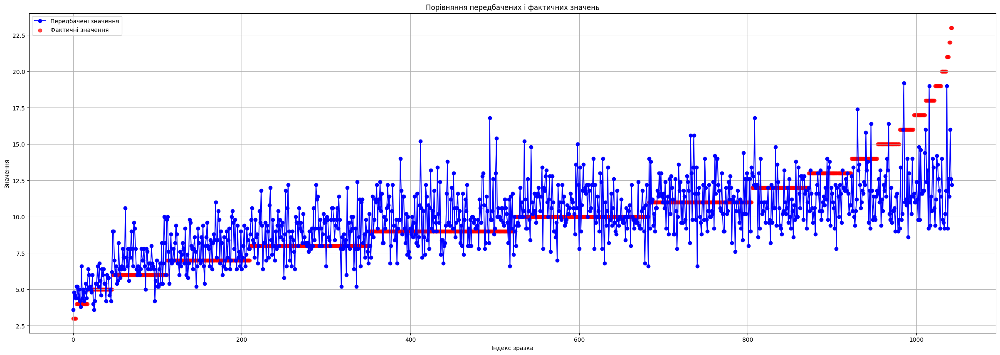

In [338]:
knn_reg = KNeighborsRegressor()

knn_reg.fit(X_train, y_train)

res = knn_reg.predict(X_test)

get_point_plot(p=res, y=y_test)

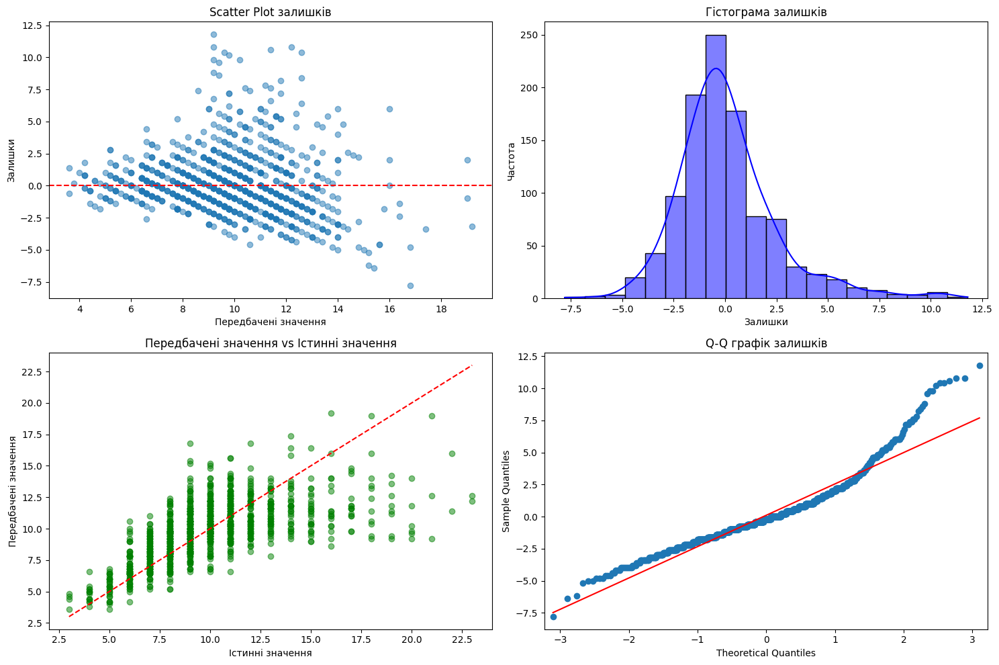

r2: 0.3945817985640008
mse: 5.9852348993288595
accuracy: 0.21764141898370087
recall: 0.21764141898370087
f1: 0.21764141898370087


In [339]:
print(get_scores(res, y_test))

In [ ]:
# бачимо, що модель непогано впоралась із задачею і здатна описати 39% даних. Але всеж видалення фіч вплинуло в гіршу сторону і трохи зменшило 
# загальну точність моделі

In [346]:
# наприкінці спробуємо на повному датасеті навчити модель класифікації
rings_count = df_orig["Rings"].value_counts()
mask = rings_count[rings_count >= 2].index
df_orig = df_orig[df_orig["Rings"].isin(mask)]
fetures, targets = df_orig.drop(columns=["Rings"]), df_orig["Rings"]

features = scaler.fit_transform(features)


X_train, X_test, y_train, y_test = train_test_split(fetures, targets, random_state=42, shuffle=True, stratify=targets)

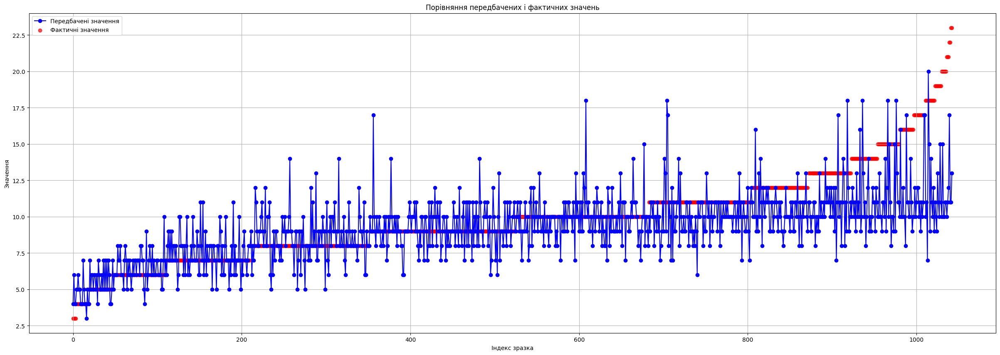

In [367]:
from sklearn.neighbors import KNeighborsClassifier

knc = KNeighborsClassifier(n_neighbors=10, weights="distance")

knc.fit(X_train, y_train)

res = knc.predict(X_test)
get_point_plot(p=res, y=y_test)

Ми явно побачили з сьогодні що ознаки з високою кореляцією за великими лаштунками дублюють одна одну.
Ми могли би досягти кращих результатів погравшись детальніше із даними в датасеті: спробувати більше алгоритмів створення сусідів, видалення екземплярів мажоритарного класу.
Також можна було б кращє дослідити викиди та спробувати всеж таки конвертувати пол через, скажемо, OneHotEncoder 
якась дивна ситуація вийшла з автопідбором гіперпараметрів на моделі регресії, в майбутньому потрібно дослідити це докладніше. 


Додатково класифікація. Таргет - стать

In [449]:
def reload_df():
    df = pd.read_csv("abalone.data", header=None) # у нас в даних немає заголовків, тож щоб 1 рядок не підтягнувся як назви колонок ставимо header = None
    col_names = ["Sex", "Length", "Diameter", "Height", "Whole weight", "Shucked weight", "Viscera weight", "Shell weight", "Rings"]
    df.columns = col_names
    # так як наш таргет - це стать, ми можемо надати цифрові класи нашому таргету
    df["Sex"] = df["Sex"].map({"M": 1, "F": 2, "I": 3})
    return df

In [450]:

df = reload_df()


In [451]:
df

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,1,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,1,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,3,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,2,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,1,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,1,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,2,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


<Axes: xlabel='Sex'>

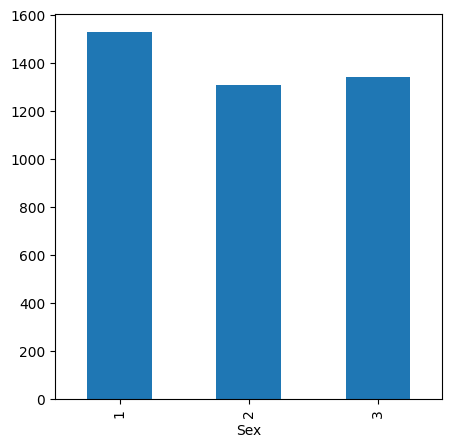

In [413]:
# розаоділ по класам
plt.figure(figsize=(5, 5))
df["Sex"].value_counts().sort_index().plot(kind="bar")
# маємо +- рівномірний розподіл по класам

In [418]:

features, target = df.drop(columns=["Sex"]), df["Sex"]
features.describe() # так як ми будемо використовувати метричну модель класифікації, то скористаємось MinMaxScaler для того щоб зберегети відстань між даними
min_max_scaller = MinMaxScaler()
features = min_max_scaller.fit_transform(features)
    
features


array([[0.51351351, 0.5210084 , 0.0840708 , ..., 0.1323239 , 0.14798206,
        0.5       ],
       [0.37162162, 0.35294118, 0.07964602, ..., 0.06319947, 0.06826109,
        0.21428571],
       [0.61486486, 0.61344538, 0.11946903, ..., 0.18564845, 0.2077728 ,
        0.28571429],
       ...,
       [0.70945946, 0.70588235, 0.18141593, ..., 0.37788018, 0.30543099,
        0.28571429],
       [0.74324324, 0.72268908, 0.13274336, ..., 0.34298881, 0.29347285,
        0.32142857],
       [0.85810811, 0.84033613, 0.17256637, ..., 0.49506254, 0.49177877,
        0.39285714]])

In [415]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.15, random_state=42, shuffle=True)

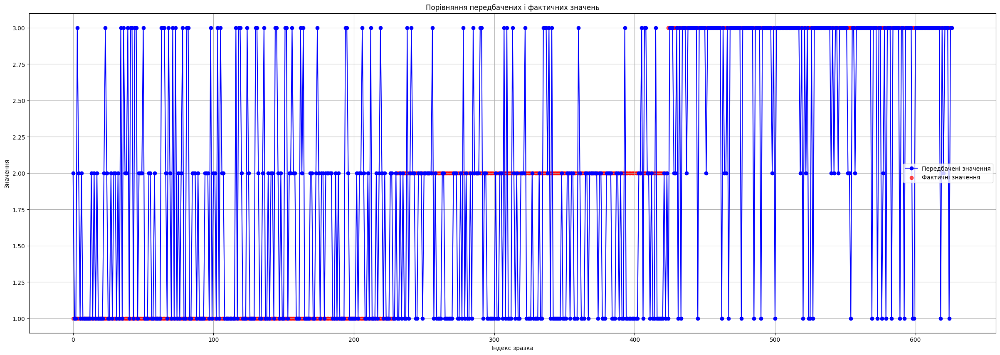

In [419]:
model = KNeighborsClassifier()

model.fit(X_train, y_train)

res = model.predict(X_test)
get_point_plot(p=res, y=y_test)

In [422]:
from sklearn.metrics import precision_score, recall_score
precision = precision_score(y_test, res, average='weighted')  # 'weighted' для врахування всіх класів
print("Precision:", precision)
recall = recall_score(y_test, res, average='weighted')
print("Recall:", recall)

Precision: 0.5403849630876396
Recall: 0.5502392344497608


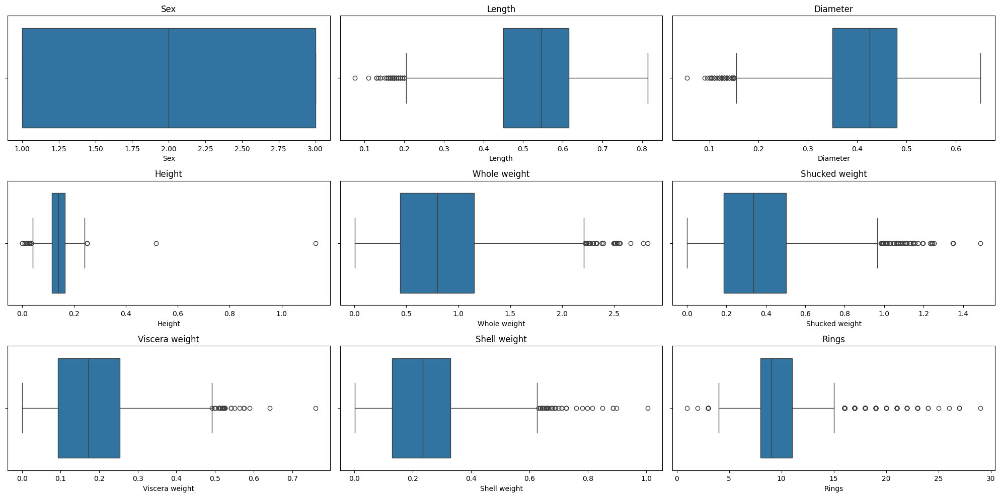

In [423]:
get_boxplots(df)

In [436]:
# відкинемо аномальні викиди по height
df = df[df["Height"] <= .3]
df = df[df["Viscera weight"] <=.6]

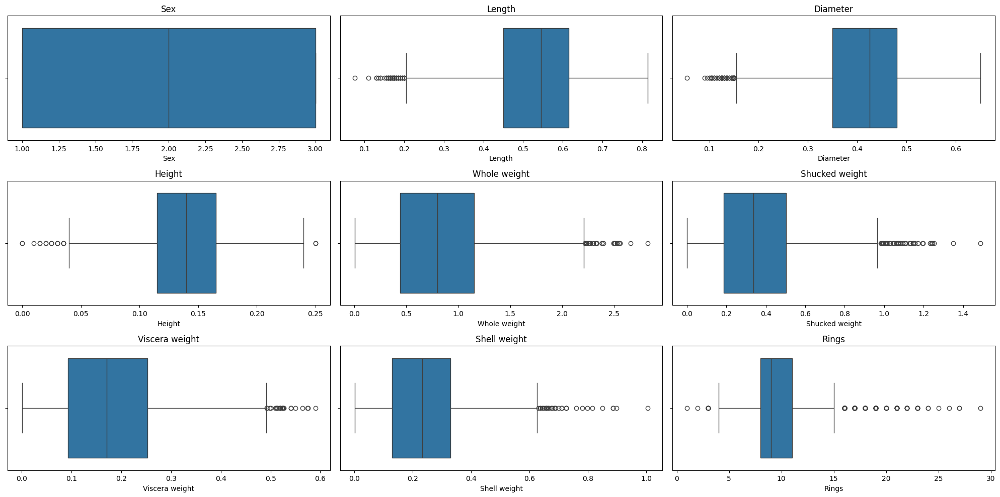

In [438]:
get_boxplots(df)

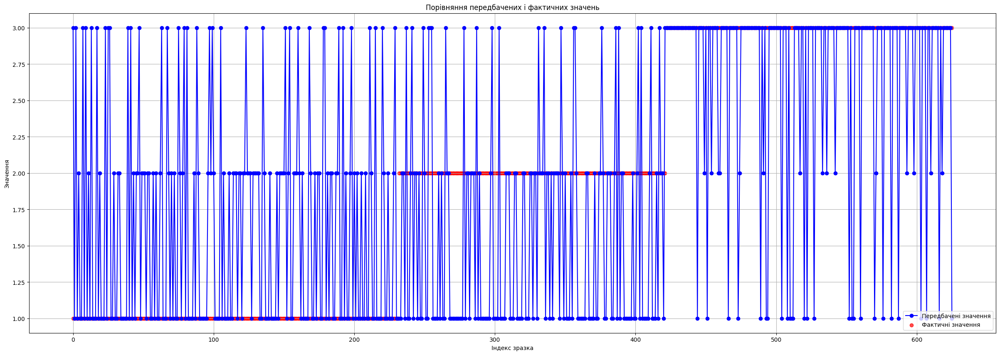

Precision: 0.5360879478291619
Recall: 0.547923322683706


In [441]:
def try_model(df, model):
    features, target = df.drop(columns=["Sex"]), df["Sex"]
    features.describe() # так як ми будемо використовувати метричну модель класифікації, то скористаємось MinMaxScaler для того щоб зберегети відстань між даними
    min_max_scaller = MinMaxScaler()
    features = min_max_scaller.fit_transform(features)
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.15, random_state=42, shuffle=True)
    model.fit(X_train, y_train)

    res = model.predict(X_test)
    get_point_plot(p=res, y=y_test)

    from sklearn.metrics import precision_score, recall_score
    precision = precision_score(y_test, res, average='weighted')  # 'weighted' для врахування всіх класів
    print("Precision:", precision)
    recall = recall_score(y_test, res, average='weighted')
    print("Recall:", recall)

In [452]:
# модель стала трохи гіршою, тож  повернемо як було
df = reload_df()
df

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,1,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,1,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,3,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,2,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,1,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,1,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,2,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [459]:
features, target = df.drop(columns=["Sex"]), df["Sex"]
features.describe() # так як ми будемо використовувати метричну модель класифікації, то скористаємось MinMaxScaler для того щоб зберегети відстань між даними
min_max_scaller = MinMaxScaler()
features = min_max_scaller.fit_transform(features)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.15, shuffle=True, stratify=target, random_state=42)

In [460]:
param_grid = {
    "n_neighbors": list(range(2, 50)),  
    "weights": ["uniform", "distance"],  
    "leaf_size": list(range(10, 70, 5)),
    "p": [1, 2]  
}
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=6, n_jobs=-1, scoring='average_precision', verbose=1)
grid_search.fit(X_train, y_train)

print("Найкращі параметри: ", grid_search.best_params_)
print("Найкращий результат AP: ", grid_search.best_score_)

# Використовуємо найкращу модель для передбачення
best_model = grid_search.best_estimator_   

Fitting 6 folds for each of 2304 candidates, totalling 13824 fits


Найкращі параметри:  {'leaf_size': 10, 'n_neighbors': 48, 'p': 1, 'weights': 'distance'}
Найкращий результат AP:  0.5882628704952423


/home/dobriykot/HilelML/venv-ml/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


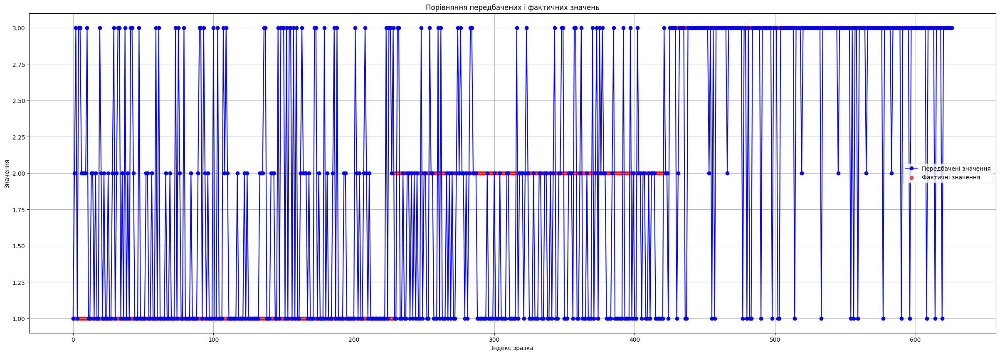

In [461]:
res = best_model.predict(X_test)
get_point_plot(res, y_test)

In [462]:
precision = precision_score(y_test, res, average='weighted') 
print("Precision:", precision)
recall = recall_score(y_test, res, average='weighted')
print("Recall:", recall)

Precision: 0.564933880778821
Recall: 0.5773524720893142


Ми змогли отримати більше половини вірних відповідей на валідаційній вибірці. Можливо якщо відібрати дані по яким модель помилил

In [463]:
# на послідок спробуємо все теж саме з застосуванням іншого скалера
from sklearn.preprocessing import StandardScaler
df = reload_df()
features, target = df.drop(columns=["Sex"]), df["Sex"]
features.describe() # так як ми будемо використовувати метричну модель класифікації, то скористаємось MinMaxScaler для того щоб зберегети відстань між даними
min_max_scaller = StandardScaler()
features = min_max_scaller.fit_transform(features)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=.15, shuffle=True, stratify=target, random_state=42)

Fitting 6 folds for each of 2304 candidates, totalling 13824 fits


/home/dobriykot/HilelML/venv-ml/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Найкращі параметри:  {'leaf_size': 10, 'n_neighbors': 49, 'p': 2, 'weights': 'distance'}
Найкращий результат AP:  0.5812473830685679


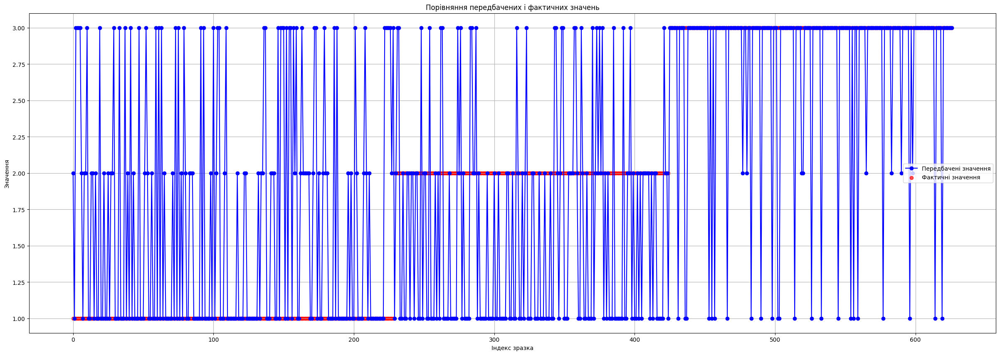

Precision: 0.5569321333286068
Recall: 0.5709728867623605


In [465]:
param_grid = {
    "n_neighbors": list(range(2, 50)),  
    "weights": ["uniform", "distance"],  
    "leaf_size": list(range(10, 70, 5)),
    "p": [1, 2]  
}
model = KNeighborsClassifier()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=6, n_jobs=-1, scoring='average_precision', verbose=1)
grid_search.fit(X_train, y_train)

print("Найкращі параметри: ", grid_search.best_params_)
print("Найкращий результат AP: ", grid_search.best_score_)

# Використовуємо найкращу модель для передбачення
best_model = grid_search.best_estimator_   


res = best_model.predict(X_test)
get_point_plot(res, y_test)

precision = precision_score(y_test, res, average='weighted') 
print("Precision:", precision)
recall = recall_score(y_test, res, average='weighted')
print("Recall:", recall)

Бачимо що від застосування StandardScaler результати трохи погіршились. Тож теорія про те що застосування minmaxscaler буде доцільнішим - може рахуватись вірною.